In [ ]:
!pip install -q --upgrade keras-cv
!pip install -q pycocotools

In [1]:
import os
os.environ["KERAS_BACKEND"] = "jax"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3" 

import keras # 3.x
import keras_cv
from keras_cv import bounding_box
from keras_cv import visualization
import matplotlib.pyplot as plt
import matplotlib.patches as p
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split
import tqdm
import tensorflow as tf
from tensorflow import data as tf_data

In [2]:
# global constants
BATCH_SIZE = 16
WORK_DIR = "/kaggle/working"
LEARNING_RATE = 1e-4
GLOBAL_CLIPNORM = 10.

## Load Data

In [3]:
train_img_path = "/kaggle/input/airbus-aircrafts-sample-dataset/images"
train_annot_path = "/kaggle/input/airbus-aircrafts-sample-dataset/annotations.csv"
test_img_path = "/kaggle/input/airbus-aircrafts-sample-dataset/extras"

In [4]:
annotations_df = pd.read_csv(train_annot_path)
annotations_df.head()

,id,image_id,geometry,class
0,1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",Airplane
1,2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",Airplane
2,3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",Airplane
3,4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(813, 1518), (885, 1518), (885, 1604), (813, ...",Airplane
4,5,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(594, 938), (657, 938), (657, 1012), (594, 10...",Airplane


In [5]:
annotations_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3425 entries, 0 to 3424
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        3425 non-null   int64 
 1   image_id  3425 non-null   object
 2   geometry  3425 non-null   object
 3   class     3425 non-null   object
dtypes: int64(1), object(3)
memory usage: 107.2+ KB


## Prepare Data

In [6]:
# convert BB into XYXY format by selecting only 0-th and 2-nd tuple from a BB list of XY tuples; flatten into a list
annotations_df["geometry"] = annotations_df["geometry"].apply(eval)
annotations_df["xyxy"] = annotations_df['geometry'].apply(lambda x: [x[0][0], x[0][1], x[2][0], x[2][1]])
annotations_df

,id,image_id,geometry,class,xyxy
0,1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",Airplane,"[135, 522, 245, 600]"
1,2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",Airplane,"[1025, 284, 1125, 384]"
2,3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",Airplane,"[1058, 1503, 1130, 1568]"
3,4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(813, 1518), (885, 1518), (885, 1604), (813, ...",Airplane,"[813, 1518, 885, 1604]"
4,5,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(594, 938), (657, 938), (657, 1012), (594, 10...",Airplane,"[594, 938, 657, 1012]"
...,...,...,...,...,...
3420,3421,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1059, 393), (1187, 393), (1187, 522), (1059,...",Airplane,"[1059, 393, 1187, 522]"
3421,3422,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(932, 355), (1028, 355), (1028, 461), (932, 4...",Airplane,"[932, 355, 1028, 461]"
3422,3423,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(2461, 244), (2560, 244), (2560, 345), (2461,...",Truncated_airplane,"[2461, 244, 2560, 345]"
3423,3424,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1820, 344), (1937, 344), (1937, 443), (1820,...",Airplane,"[1820, 344, 1937, 443]"


In [7]:
# merge dataframe rows to have 1 image per row with all its BBs and class labels
grouped = annotations_df.groupby("image_id")[["xyxy", "class"]].agg(list).reset_index()
grouped

,image_id,xyxy,class
0,014de911-7810-4f7d-8967-3e5402209f4a.jpg,"[[2404, 35, 2493, 102], [2388, 114, 2475, 196]...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
1,0263270b-e3ee-41dc-aeef-43ff77e66d5b.jpg,"[[1962, 413, 2048, 482], [767, 306, 828, 360],...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
2,03f84930-e2be-4c19-9afc-0dc26d02538e.jpg,"[[1713, 968, 1813, 1087], [2077, 1175, 2138, 1...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
3,0641acc3-c0b9-4f9d-b0ba-7ad18aa08864.jpg,"[[171, 216, 242, 294], [406, 357, 472, 421], [...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
4,074737f4-7f59-4729-be5d-67f6f1d34668.jpg,"[[534, 5, 634, 76], [701, 89, 796, 202], [516,...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
...,...,...,...
98,f82d64a6-3bfa-4612-bcbd-847a7d89c296.jpg,"[[1379, 429, 1470, 531], [1627, 248, 1707, 345...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
99,fc06c595-7905-46c3-91c0-daf56af0f926.jpg,"[[1170, 157, 1289, 301], [1370, 402, 1495, 537...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
100,fc1ab8ce-e531-46ed-b74b-0374cd58cf2a.jpg,"[[1536, 687, 1654, 834], [1697, 760, 1790, 868...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
101,fc8f9dc5-b6a2-49f3-9bde-1f8ff382ca5f.jpg,"[[1513, 123, 1664, 259], [2267, 214, 2329, 294...","[Airplane, Airplane, Airplane, Airplane, Airpl..."


In [8]:
# count number of BBs per image
grouped["n_bb"] = grouped["xyxy"].apply(lambda x: len([eval(str(bb)) for bb in x]))

In [9]:
grouped.describe()

,n_bb
count,103.000000
mean,33.252427
std,16.842825
min,5.000000
25%,23.000000
50%,30.000000
75%,39.500000
max,92.000000


### Visualization

Plot images with minimum and maximum number of bounding boxes.

In [10]:
# set class to id mapping and vice versa for visualization purposes
class_to_id = {"Airplane": 0, "Truncated_airplane": 1}
id_to_class = {0: "Airplane", 1: "Truncated_airplane"}

In [11]:
# utility function to plot n-th image along with its bounding boxes and class 
# labels given the DataFrame with all the necessary information
def visualize_example(df, n):
    filepath = os.path.join(train_img_path, df.loc[n, "image_id"])
    image = keras.utils.load_img(filepath)
    image = np.expand_dims(np.array(image), axis=0)
    classes = np.expand_dims(np.array([class_to_id[cl] for cl in df.loc[n, "class"]]), axis=0)
    boxes = np.expand_dims(np.array(df.loc[n, "xyxy"]), axis=0)
    bboxes = {"boxes": boxes, "classes": classes}
    print(f"Image shape: {image.shape}")
    print(f"Number of bounding boxes: {boxes.shape[1]}")
    visualization.plot_bounding_box_gallery(
        image,
        value_range=(0, 255),
        rows=1,
        cols=1,
        y_pred=bboxes,
        scale=12,
        font_scale=0.7,
        bounding_box_format="xyxy",
        class_mapping=id_to_class, 
        line_thickness=1,
    )

Image shape: (1, 2560, 2560, 3)
Number of bounding boxes: 92


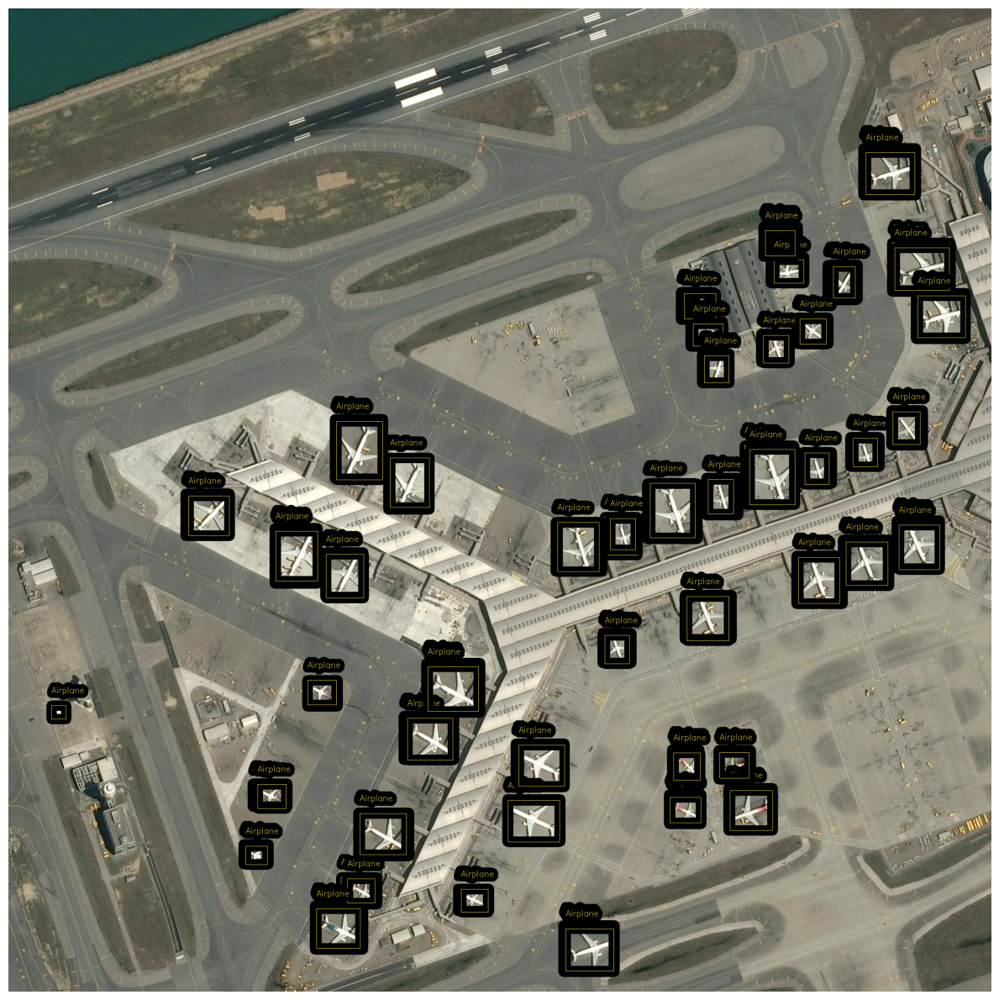

In [12]:
# image containing the maximum number of BBs
max_bb_id = grouped.loc[grouped["n_bb"] == 92].index.values[0]
visualize_example(grouped, max_bb_id)

Apparently, the image contains bounding boxes that overlap a lot, which might be a case for other images too. This problem can be addressed by removing bounding boxes with high IOU score.

In [13]:
# function to calculate IOU score between 2 BBs
def iou(bb1, bb2):
    # (x, y) coordinates of the intersection
    x1 = max(bb1[0], bb2[0])
    y1 = max(bb1[1], bb2[1])
    x2 = min(bb1[2], bb2[2])
    y2 = min(bb1[3], bb2[3])
    
    # intersection area of two bounding boxes
    inter_area = max(0, x2 - x1 + 1) * max(0, y2 - y1 + 1)
    # area of the first and the second bounding box
    bb1_area = max(0, bb1[2] - bb1[0] + 1) * max(0, bb1[3] - bb1[1] + 1)
    bb2_area = max(0, bb2[2] - bb2[0] + 1) * max(0, bb2[3] - bb2[1] + 1)
    
    # intersection over union
    return inter_area / float(bb1_area + bb2_area - inter_area)

In [14]:
# function that calculates BBs similarity based on their IOU, 
# if IOU score is < min threshold, BBs are considered non overlapping,
# otherwise from the 2 most similar BBs only one is picked
def similar_bb_ids(bbs, min_thresh):
    n = len(bbs)
    bb_id_pairs = []
    # pairwise BBs iou calculation
    for i in range(n):
        bb_scores = []
        for j in range(n):
            bb1, bb2 = bbs[i], bbs[j] 
            bb_scores.append(iou(bb1, bb2))
        # sort i-th BB iou scores in descending order, if the second iou score is 
        # less than the min threshold, BB has no significant overlap with any other 
        # BB except with itself (the first iou score)
        if (np.sort(bb_scores)[::-1][1] <= min_thresh):
            bb_id_pairs.append((i, i))
        # otherwise find a BB with the highest iou score as the most overlapping 
        else:
            max_score_id = np.argsort(bb_scores)[::-1][1]
            bb_id_pairs.append((i, max_score_id))
    return bb_id_pairs

In [15]:
def non_overlap_bbs(df, min_threshold=0.15, verbose=True):
    df_copy = df.copy()
    # loop through all the images in the dataframe
    for i, row in df_copy.iterrows():
        # for each BB of the i-th image get the most overlapping BB indices  
        bb_id_pairs = similar_bb_ids(row["xyxy"], min_threshold)
        # find non-overlapping BB indices
        nov_ids = [tuple(x)[1] for x in set(tuple(sorted(pair)) for pair in bb_id_pairs)]
        # select non-overlapping BBs
        nov_bbs = np.array(row["xyxy"])[nov_ids].tolist()
        # select corresponding class names
        nov_classes = np.array(row["class"])[nov_ids].tolist()
        # replace a row in DataFrame if number on BBs before and after similarity measuring is different
        if len(row["xyxy"]) != len(nov_bbs):
            if verbose:
                print(f"({i}) {row['image_id']}: {len(row['xyxy'])}/{len(nov_bbs)} (old/new)")
            df_copy.iloc[i] = pd.Series([row["image_id"], nov_bbs, nov_classes, len(nov_bbs)])
    return df_copy

In [16]:
# get updated DataFrame version with highly overlapping BBs removed
# show rows and the corresponding ids, where the BB update was performed
grouped_up = non_overlap_bbs(grouped, min_threshold=0.15)

(10) 1e7e0450-6eb3-479e-88c2-990abc8207fa.jpg: 52/26 (old/new)
(23) 48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg: 35/18 (old/new)
(50) 7635d63c-6b97-4c9c-a7dc-27773d42ed4c.jpg: 60/30 (old/new)
(79) ca7b1077-0d37-4ada-9d56-0e66f864935e.jpg: 16/8 (old/new)
(85) d9399a45-6745-4e59-8903-90640b2ddf9f.jpg: 92/47 (old/new)
(86) dacabde6-c8a7-475b-ab26-81b4e4dd5977.jpg: 54/27 (old/new)
(100) fc1ab8ce-e531-46ed-b74b-0374cd58cf2a.jpg: 58/29 (old/new)


Image shape: (1, 2560, 2560, 3)
Number of bounding boxes: 47


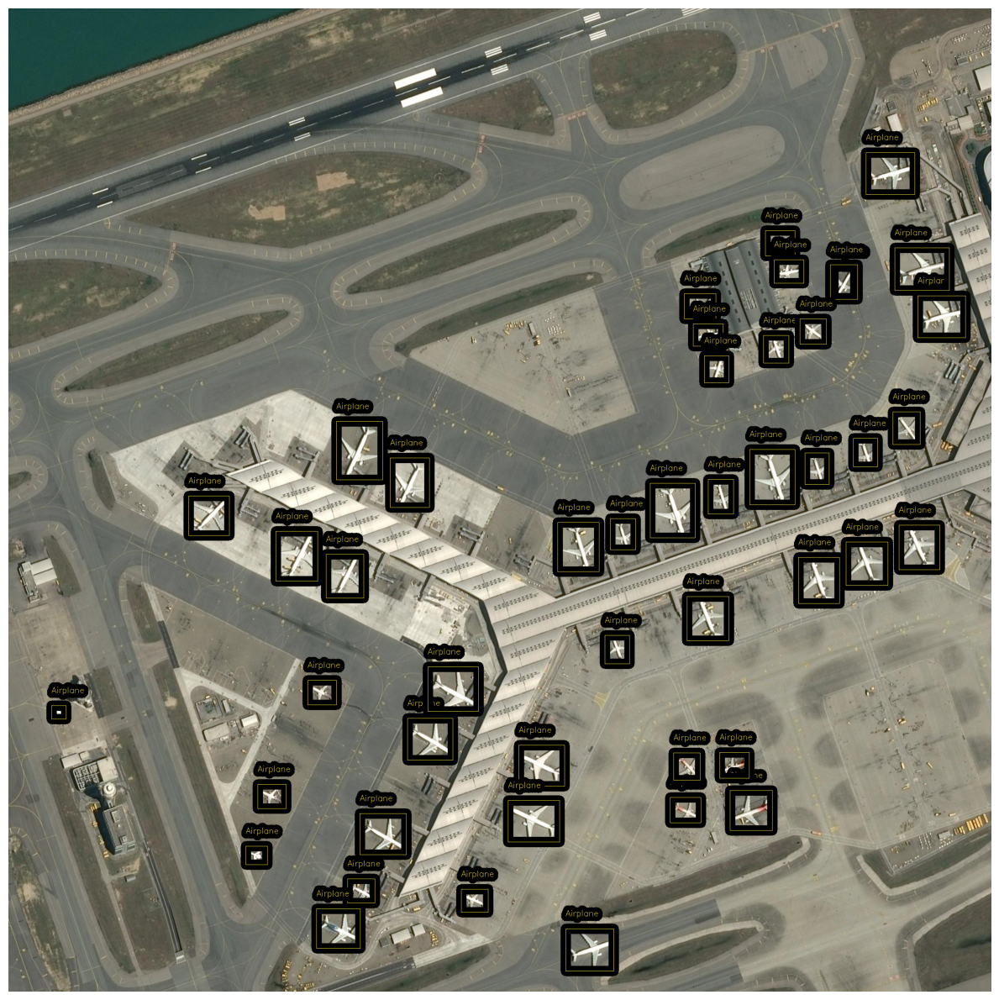

In [17]:
# visualize the same image with updated BBs
visualize_example(grouped_up, max_bb_id)

### Training & Validation Split
In order to avoid data leakage later in the training process when training on image patches, we should split into training and validation subsets directly on images not on their patches. 

In [18]:
# split into train/valid
train, valid = train_test_split(grouped_up, test_size=0.1, random_state=42)

print(f"Training images count: {len(train)} \nValidation images count: {len(valid)}")

Training images count: 92 
Validation images count: 11


### Preprocess
Create image patches of size 512x512.

In [31]:
# set up constants
IMG_SIZE = 2560
PATCH_SIZE = 512
STEP = 256

In [32]:
# transform dataset to have just one class label
class_to_id = {"Airplane": 0, "Truncated_airplane": 0}

train["class_id"] = train.loc[:, "class"].apply(lambda row: [class_to_id[item] for item in row])
valid["class_id"] = valid.loc[:, "class"].apply(lambda row: [class_to_id[item] for item in row])

train

,image_id,xyxy,class,n_bb,class_id
31,4fdabd34-a2fd-4f0a-bb48-01fe043f1499.jpg,"[[2526, 642, 2560, 723], [1857, 419, 1927, 499...","[Truncated_airplane, Airplane, Airplane, Airpl...",35,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
97,f34f05c6-84ce-47d7-ba5c-394d85c86a46.jpg,"[[1505, 233, 1587, 331], [960, 9, 1064, 121], ...","[Airplane, Airplane, Airplane, Airplane, Airpl...",25,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
85,d9399a45-6745-4e59-8903-90640b2ddf9f.jpg,"[[2148, 672, 2205, 754], [2200, 1119, 2263, 11...","[Airplane, Airplane, Airplane, Airplane, Airpl...",47,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
76,bfc53eb0-eb57-4dd7-8c1e-8e42ba49757b.jpg,"[[2309, 2125, 2351, 2191], [2459, 2022, 2522, ...","[Airplane, Airplane, Airplane, Airplane, Airpl...",35,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,074737f4-7f59-4729-be5d-67f6f1d34668.jpg,"[[534, 5, 634, 76], [701, 89, 796, 202], [516,...","[Airplane, Airplane, Airplane, Airplane, Airpl...",30,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
...,...,...,...,...,...
71,b6e9f8fc-3fbd-411a-a1e5-b853e8fbe2ac.jpg,"[[67, 146, 151, 224], [509, 413, 618, 526], [6...","[Airplane, Airplane, Airplane, Airplane, Airpl...",29,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
14,2314c1b5-ec8f-4212-b42f-43365a13fd20.jpg,"[[1748, 27, 1870, 178], [2057, 284, 2193, 434]...","[Airplane, Airplane, Truncated_airplane, Trunc...",20,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
92,ed921ec7-b950-460c-a912-12247d867fea.jpg,"[[2291, 455, 2391, 558], [2053, 506, 2148, 616...","[Airplane, Airplane, Airplane, Airplane, Airpl...",26,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
51,77f7b57f-5cf2-424d-a952-9847b3c3f35e.jpg,"[[2393, 41, 2478, 99], [2382, 125, 2462, 193],...","[Airplane, Airplane, Airplane, Airplane, Airpl...",31,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [33]:
# get patching grid to cut images
def get_grid(img_size, patch_size, step):
    # overlapping patches
    if step:
        n_steps = (img_size - patch_size) // step + 1
        x_coords = [(x * step, x * step + patch_size) for x in range(n_steps)]
        y_coords = [(y * step, y * step + patch_size) for y in range(n_steps)]
    # non-overlapping patches
    else: 
        n_steps = img_size // patch_size  # Calculate the number of steps to cover the image
        x_coords = [(x * patch_size, (x + 1) * patch_size) for x in range(n_steps)]
        y_coords = [(y * patch_size, (y + 1) * patch_size) for y in range(n_steps)]
    grid = [[(x[0], x[1]), (y[0], y[1])] for x in x_coords for y in y_coords]
    return grid
    
GRID = get_grid(IMG_SIZE, PATCH_SIZE, step=STEP)
N_PATCHES = len(GRID)
print(f"Number of {PATCH_SIZE}x{PATCH_SIZE} patches from {IMG_SIZE}x{IMG_SIZE} image: {N_PATCHES}")

Number of 512x512 patches from 2560x2560 image: 81


In [34]:
def patch_images(images, grid=GRID, step=PATCH_SIZE):
    n_images = images.shape[0]
    n_patches = len(grid)
    patches = np.zeros((n_images, n_patches, step, step, 3))
    for i, (x, y) in enumerate(grid):
        patches[:, i] = images[:, x[0]:x[1], y[0]:y[1]]
    return patches

In [35]:
# add "classes" annotations to BBs (multiclass problem)
def cut_bounding_boxes(bounding_boxes, grid_coord, classes, min_area_proportion):
    (y1, y2), (x1, x2) = grid_coord
    patch_bboxes = []
    patch_classes = []
    for bb_coords, bb_class in zip(bounding_boxes, classes):
        bx1, by1, bx2, by2 = bb_coords    
        # Check if any corner of the bounding box is within the patch
        cond_h = (x1<bx1<x2 or x1<bx2<x2 or bx1<x1<bx2 or bx1<x2<bx2)
        cond_w = (y1<by1<y2 or y1<by2<y2 or by1<y1<by2 or by1<y2<by2)
        if cond_h and cond_w: #and i not in included_bboxes:  
            # Determine the starting corner
            start_x = max(x1, bx1)
            start_y = max(y1, by1)
            # Calculate the adjusted bounding box coordinates relative to the patch
            new_bb = [start_x - x1, start_y - y1, min(bx2, x2) - x1, min(by2, y2) - y1]
            orig_bb_area = (bx2 - bx1 + 1) * (by2 - by1 + 1)
            new_bb_area = (new_bb[2] - new_bb[0] + 1) * (new_bb[3] - new_bb[1] + 1)
            if (new_bb_area / orig_bb_area) >= min_area_proportion:
                patch_bboxes.append(new_bb)
                patch_classes.append(bb_class)
            else:
                continue
    return patch_bboxes, patch_classes

In [36]:
def patch_image_bbox(image, bboxes, classes, grid=GRID, patch_size=PATCH_SIZE, min_area_proportion=0.5):
    n_patches = len(grid)
    patches = np.zeros((n_patches, patch_size, patch_size, 3))
    image_bboxes = []
    bb_classes = []
    # Loop over grid coordinates
    for i, (x, y) in enumerate(grid):
        patch = image[:, x[0]:x[1], y[0]:y[1]]
        patches[i] = patch
        # Calculate bounding boxes for the image
        bbs, bb_cls = cut_bounding_boxes(bboxes, [x, y], classes, min_area_proportion=min_area_proportion)
        image_bboxes.append(bbs)
        bb_classes.append(bb_cls)
    return patches, image_bboxes, bb_classes

# Assuming you have already defined 'PATCH_SIZE', 'image', 'bboxes', and 'grid'
filepath = os.path.join(train_img_path, train.loc[max_bb_id, "image_id"])
image = keras.utils.load_img(filepath)
image = np.expand_dims(np.array(image), axis=0)
b_boxes = np.array(train.loc[max_bb_id, "xyxy"])
classes = train.loc[max_bb_id, "class"]
patches, patches_bboxes, patches_classes = patch_image_bbox(image, b_boxes, classes)

Visualization of image patching along with its bounding boxes.

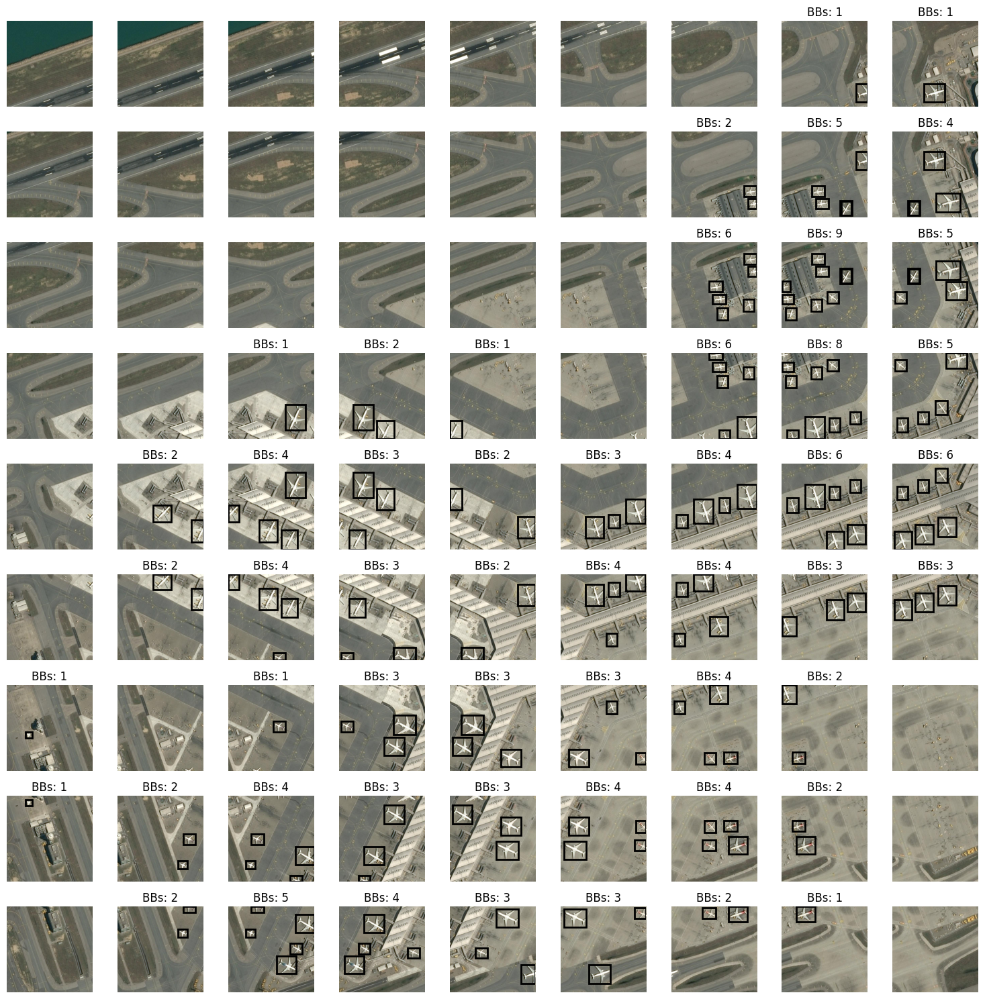

In [37]:
num_rows, num_cols = 9, 9
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

for i in range(num_rows):
    for j in range(num_cols):
        index = i * num_cols + j
        axes[i, j].imshow(patches[index]/255., cmap='gray')
        axes[i, j].axis('off')
        if len(patches_bboxes[index]) > 0:
            for bboxes in patches_bboxes[index]:
                x1, y1, x2, y2 = bboxes
                rect = p.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='black', lw=2, facecolor='none')
                axes[i, j].add_patch(rect)
                axes[i, j].set_title(f"BBs: {len(patches_bboxes[index])}")
plt.tight_layout()
plt.show()

### Prepare datasets

1. Patch each training and validation image along with its corresponding BBs, save patches as separate images of predefined size, save each patch information: unique image id, BBs, class ids;
2. Using information from DataFrames load images, BBs, class ids as tf.data train/valid datasets;
3. Apply training data augmentation.
4. Transform dataset records from dictionaries to tuples, prefetch for efficiency.

In [38]:
# patch images along with bounding boxes, save patches and the corresponding patching info to the DataFrame
def prepare_data(df, img_dir, split_name, class_mapping=class_to_id, n_patches=N_PATCHES):
    new_df = {}
    id_col, bb_col, class_col = [], [], []
    for i, row in df.iterrows():
        image_id = row["image_id"]
        image_bbs = row["xyxy"]
        image_class_ids = row["class_id"]
        # load image 
        path = os.path.join(img_dir, image_id)
        image = keras.utils.load_img(path)
        image = np.expand_dims(np.array(image), axis=0)
        # patch image and its bounding boxes
        patches, patches_bboxes, patches_classes = patch_image_bbox(image, image_bbs, image_class_ids)
        image_name, image_ext = image_id.split(".")
        patch_ids = [image_name + f"_{index}." + image_ext for index in range(n_patches)]
        id_col.extend(patch_ids)
        class_col.extend(patches_classes)
        # save patched images and BBs
        for idx, patch_id in enumerate(patch_ids):
            img = Image.fromarray(patches[idx].astype(np.uint8))
            img.save(patch_id)
            # empty list for each patch bounding boxes
            patch_bb = []
            for bbcoords in patches_bboxes[idx]:
                patch_bb.append(bbcoords)
            bb_col.append(patch_bb)
    # add information about patches and corresponding bounding box coordinates to a DataFrame
    new_df["image_id"] = id_col
    new_df["xyxy"] = bb_col
    new_df["class_id"] = class_col
    # save information as a csv file
    pd.DataFrame(new_df).to_csv(split_name + ".csv", index=False)

In [39]:
# validation dataset
prepare_data(valid, img_dir=train_img_path, split_name="valid")
patch_valid_df = pd.read_csv("/kaggle/working/valid.csv")
patch_valid_df

,image_id,xyxy,class_id
0,4f833867-273e-4d73-8bc3-cb2d9ceb54ef_0.jpg,[],[]
1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef_1.jpg,[],[]
2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef_2.jpg,[],[]
3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef_3.jpg,"[[257, 284, 357, 384]]",[0]
4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef_4.jpg,"[[1, 284, 101, 384]]",[0]
...,...,...,...
886,34ae857d-6e71-46b9-b694-d9e40fb093bc_76.jpg,"[[133, 60, 271, 219]]",[0]
887,34ae857d-6e71-46b9-b694-d9e40fb093bc_77.jpg,"[[209, 362, 315, 473]]",[0]
888,34ae857d-6e71-46b9-b694-d9e40fb093bc_78.jpg,"[[455, 387, 512, 480], [335, 386, 439, 491], [...","[0, 0, 0, 0]"
889,34ae857d-6e71-46b9-b694-d9e40fb093bc_79.jpg,"[[460, 127, 512, 226], [222, 113, 326, 218], [...","[0, 0, 0, 0, 0]"


In [40]:
# training dataset
prepare_data(train, img_dir=train_img_path, split_name="train")
patch_train_df = pd.read_csv("/kaggle/working/train.csv")
patch_train_df

,image_id,xyxy,class_id
0,4fdabd34-a2fd-4f0a-bb48-01fe043f1499_0.jpg,[],[]
1,4fdabd34-a2fd-4f0a-bb48-01fe043f1499_1.jpg,[],[]
2,4fdabd34-a2fd-4f0a-bb48-01fe043f1499_2.jpg,"[[378, 463, 467, 512]]",[0]
3,4fdabd34-a2fd-4f0a-bb48-01fe043f1499_3.jpg,"[[263, 441, 351, 512], [122, 463, 211, 512]]","[0, 0]"
4,4fdabd34-a2fd-4f0a-bb48-01fe043f1499_4.jpg,"[[7, 441, 95, 512]]",[0]
...,...,...,...
7447,fca12ef2-0f65-48d0-a4aa-6bae562f2236_76.jpg,[],[]
7448,fca12ef2-0f65-48d0-a4aa-6bae562f2236_77.jpg,[],[]
7449,fca12ef2-0f65-48d0-a4aa-6bae562f2236_78.jpg,[],[]
7450,fca12ef2-0f65-48d0-a4aa-6bae562f2236_79.jpg,[],[]


In [41]:
# load image, its BBs and class ids
def load_data(image_path, bboxes, classes):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3) 
    image = tf.cast(image, tf.float32)  
    image.set_shape([512, 512, 3])
    bounding_boxes = {
        "classes": tf.cast(classes, dtype=tf.float32),
        "boxes": bboxes,
    }
    return {"images": image, "bounding_boxes": bounding_boxes}

# load saved image patches into tf.data Dataset
def get_dataset(df, parent_dir, shuffle=False, batch=True, batch_size=BATCH_SIZE):
    paths = tf.ragged.constant([os.path.join(parent_dir, path) for path in df.loc[:, "image_id"]])
    bboxes = tf.ragged.constant([eval(str(bb)) for bb in df.loc[:, "xyxy"]])
    class_labels = tf.ragged.constant([eval(str(cl)) for cl in df.loc[:, "class_id"]])
    dataset = tf.data.Dataset.from_tensor_slices((paths, bboxes, class_labels))
    dataset = dataset.map(load_data, num_parallel_calls=tf_data.AUTOTUNE)
    if shuffle:
        dataset = dataset.shuffle(BATCH_SIZE*8)
    if batch:
        dataset = dataset.ragged_batch(batch_size=batch_size, drop_remainder=True)
    return dataset

# utility function for tf.data Datasets visualization
def visualize_dataset(inputs, value_range, rows, cols, class_mapping=id_to_class, bounding_box_format="xyxy"):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.5,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )

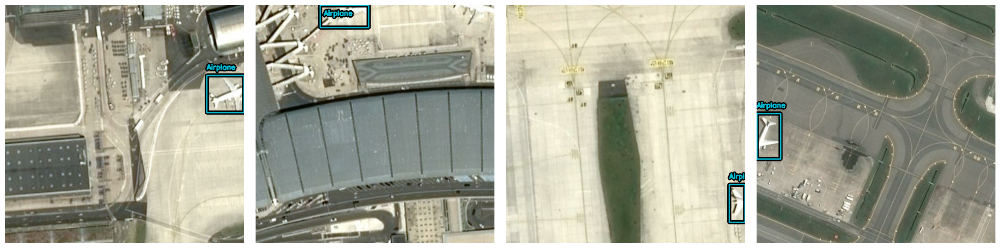

In [63]:
# load training dataset, shuffle and batch it
train_ds = get_dataset(patch_train_df, WORK_DIR, shuffle=True)

visualize_dataset(
    train_ds, bounding_box_format="xyxy", value_range=(0, 255), rows=1, cols=4,
)

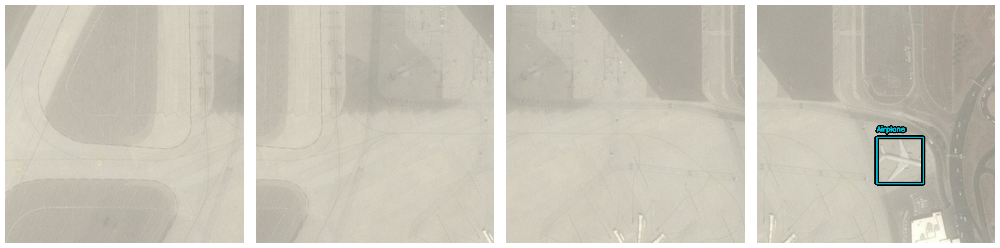

In [64]:
# load validation dataset, batch it
valid_ds = get_dataset(patch_valid_df, WORK_DIR)

visualize_dataset(
    valid_ds, bounding_box_format="xyxy", value_range=(0, 255), rows=1, cols=4
)

Transform the datasets from dictionary to tuple format for the ease of training, add training data augmentations, and data prefetching for performance. 

In [65]:
# dict -> tuple mapping
def dict_to_tuple(inputs):
    return inputs["images"], bounding_box.to_dense(inputs["bounding_boxes"], max_boxes=32)

# aumentation layers
aug_layers = [
    keras_cv.layers.RandomFlip(mode="horizontal_and_vertical", bounding_box_format="xyxy"),
    keras_cv.layers.JitteredResize(target_size=(512, 512), scale_factor=(0.8, 0.8), bounding_box_format="xyxy",)
]

# augmentator to transform inputs
def create_augmenter_fn(aug_layers):
    def augmenter_fn(inputs):
        for aug_layer in aug_layers:
            inputs = aug_layer(inputs)
        return inputs
    return augmenter_fn

In [66]:
# final data transformations
# training dataset
augmenter_fn = create_augmenter_fn(aug_layers)
train_ds = train_ds.map(augmenter_fn, num_parallel_calls=tf_data.AUTOTUNE)
train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)
train_ds = train_ds.prefetch(tf_data.AUTOTUNE)

# validation dataset
valid_ds = valid_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)
valid_ds = valid_ds.prefetch(tf_data.AUTOTUNE)

## Pretrained Model

1. Train RetinaNet model.
2. Test trained model on unseen data.

In [48]:
# utils for model prediction visualization
def visualize_detections(model, dataset, bounding_box_format, rows=1, cols=2, scale=4, labeled=True):
    if labeled:
        images, y_true = next(iter(dataset.take(1)))
        y_pred = model.predict(images)
    else:
        images, y_true = dataset, None
        y_pred = model.predict(images)
    visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_true=y_true,
        y_pred=y_pred,
        scale=scale,
        rows=rows,
        cols=cols,
        show=True,
        font_scale=0.7,
        class_mapping=id_to_class,
    )

In [49]:
# callback for tracking coco metrics during training
class EvaluateCOCOMetricsCallback(keras.callbacks.Callback):
    def __init__(self, data, save_path):
        super().__init__()
        self.data = data
        self.metrics = keras_cv.metrics.BoxCOCOMetrics(
            bounding_box_format="xyxy",
            evaluate_freq=1e9,
        )
        self.save_path = save_path
        self.best_map = -1.0

    def on_epoch_end(self, epoch, logs):
        self.metrics.reset_state()
        for batch in self.data:
            images, y_true = batch[0], batch[1]
            y_pred = self.model.predict(images, verbose=0)
            self.metrics.update_state(y_true, y_pred)

        metrics = self.metrics.result(force=True)
        logs.update(metrics)

        current_map = metrics["MaP"]
        if current_map > self.best_map:
            self.best_map = current_map
            self.model.save(self.save_path)

        return logs

In [50]:
# RetinaNet with resnet50_pascalvoc weights
retina = keras_cv.models.RetinaNet.from_preset(
    "retinanet_resnet50_pascalvoc",
    bounding_box_format="xyxy",
    load_weights=True
)

optimizer = keras.optimizers.Adam(
    learning_rate=LEARNING_RATE,
    global_clipnorm=GLOBAL_CLIPNORM,
)

retina.compile(
    classification_loss="focal", 
    box_loss="smoothl1", 
    optimizer=optimizer, 
)

# train RetinaNet
retina.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=5,
    callbacks=[EvaluateCOCOMetricsCallback(valid_ds, "retina.keras")],
)

Attaching 'config.json' from model 'keras/retinanet/keras/retinanet_resnet50_pascalvoc/2' to your Kaggle notebook...
Attaching 'config.json' from model 'keras/retinanet/keras/retinanet_resnet50_pascalvoc/2' to your Kaggle notebook...
Attaching 'model.weights.h5' from model 'keras/retinanet/keras/retinanet_resnet50_pascalvoc/2' to your Kaggle notebook...


Epoch 1/5
465/465 ━━━━━━━━━━━━━━━━━━━━ 652s 1s/step - loss: 0.3902 - val_loss: 0.2432 - MaP: 0.6143 - MaP@[IoU=50]: 0.9073 - MaP@[IoU=75]: 0.7893 - MaP@[area=small]: 0.0594 - MaP@[area=medium]: 0.5935 - MaP@[area=large]: 0.7182 - Recall@[max_detections=1]: 0.2795 - Recall@[max_detections=10]: 0.6611 - Recall@[max_detections=100]: 0.6611 - Recall@[area=small]: 0.0583 - Recall@[area=medium]: 0.6458 - Recall@[area=large]: 0.7646
Epoch 2/5
465/465 ━━━━━━━━━━━━━━━━━━━━ 561s 1s/step - loss: 0.1464 - val_loss: 0.1957 - MaP: 0.6069 - MaP@[IoU=50]: 0.9258 - MaP@[IoU=75]: 0.7933 - MaP@[area=small]: 0.1661 - MaP@[area=medium]: 0.5884 - MaP@[area=large]: 0.6768 - Recall@[max_detections=1]: 0.2730 - Recall@[max_detections=10]: 0.6630 - Recall@[max_detections=100]: 0.6630 - Recall@[area=small]: 0.1917 - Recall@[area=medium]: 0.6562 - Recall@[area=large]: 0.7273
Epoch 3/5
465/465 ━━━━━━━━━━━━━━━━━━━━ 562s 1s/step - loss: 0.1189 - val_loss: 0.1627 - MaP: 0.6532 - MaP@[IoU=50]: 0.9373 - MaP@[IoU=75]: 0

The MaP value over the 5 epochs reaches 0.66, where the MaP@50 is 0.94. 

## Test Model

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step


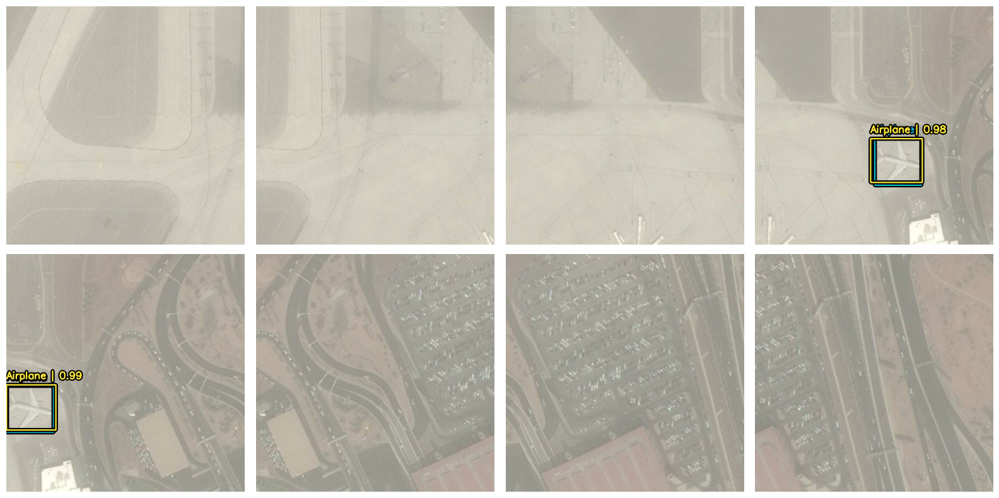

In [67]:
# load the best trained model
retina = keras.saving.load_model("retina.keras")
retina.compile(
    classification_loss="focal", 
    box_loss="smoothl1", 
    optimizer=optimizer, 
)

# test on validation set
visualize_detections(retina, dataset=valid_ds, bounding_box_format="xyxy", rows=2, cols=4)

In [55]:
# test on an unseen image
test_image = tf.io.read_file("/kaggle/input/airbus-aircrafts-sample-dataset/extras/022f91f0-1434-401f-a11b-e315b7068100.jpg")
test_image = tf.image.decode_jpeg(test_image, channels=3)
test_image = tf.cast(test_image, tf.float32)
test_image = tf.expand_dims(test_image, axis=0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 125s 125s/step


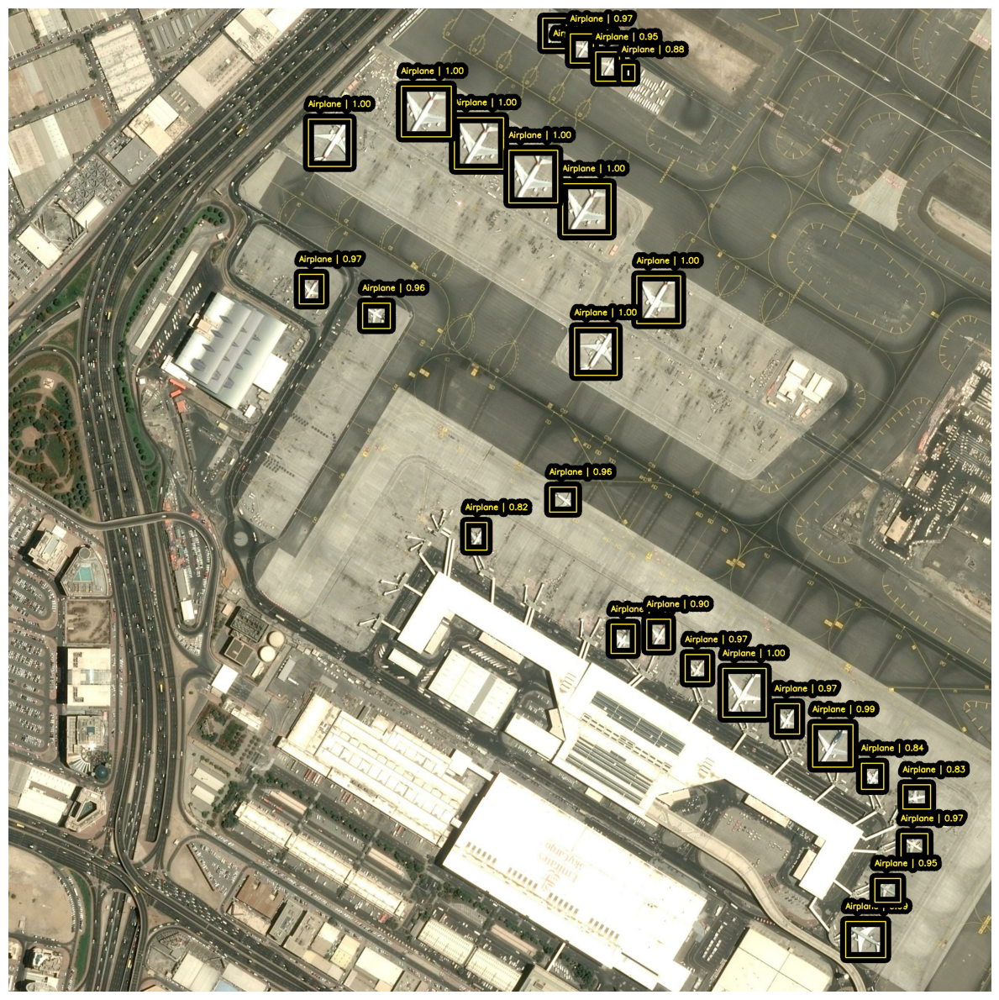

In [56]:
visualize_detections(retina, dataset=test_image, bounding_box_format="xyxy", labeled=False, rows=1, cols=1, scale=12)

In [57]:
# test on an unseen image
test_image = tf.io.read_file("/kaggle/input/airbus-aircrafts-sample-dataset/extras/65825eef-f8a1-41b3-ac87-4a0a7d482a0e.jpg")
test_image = tf.image.decode_jpeg(test_image, channels=3)
test_image = tf.cast(test_image, tf.float32)
test_image = tf.expand_dims(test_image, axis=0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 92s 92s/step


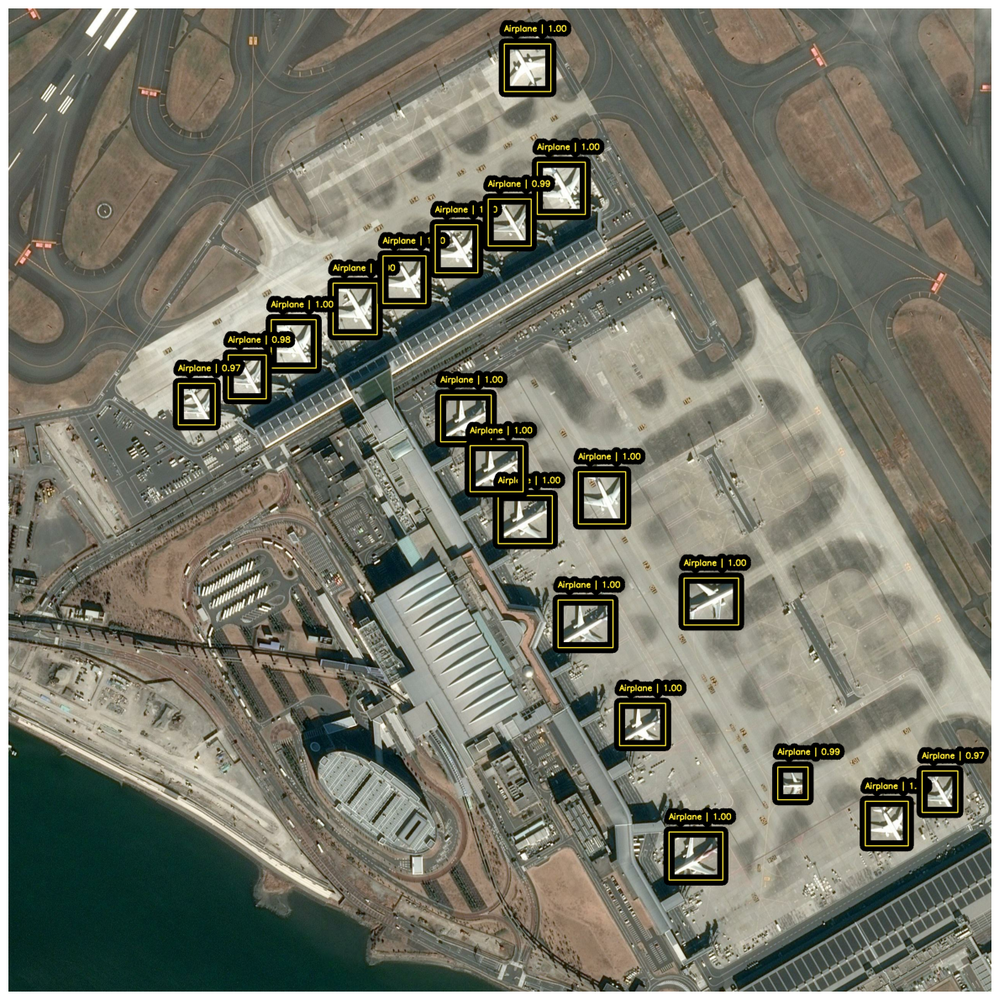

In [58]:
visualize_detections(retina, dataset=test_image, bounding_box_format="xyxy", labeled=False, rows=1, cols=1, scale=12)